# Sparse Optical Flow



In [8]:
import cv2
import numpy as np
import matplotlib.pyplot as plt
import pickle

In [9]:
%matplotlib inline

def plot_image(title, image, cmap=None):
    plt.figure(figsize=(20,20))
    plt.imshow(image, cmap=cmap)
    plt.title(title)
    plt.show()

# Example 1: Sparse Optical Flow on 2 Images

In this first part of the notebook, we'll explore Sparse Optical Flow. This technique is about calculating Optical Flow only for specific features, and not for every pixel. It is faster but not very accurate.

The algorithm we'll use for Feature Detection is the **Shi-Tomasi** detector, and the one we'll use for Optical Flow is called **Lucas-Kanade**.

These are the more "traditional" approaches. 

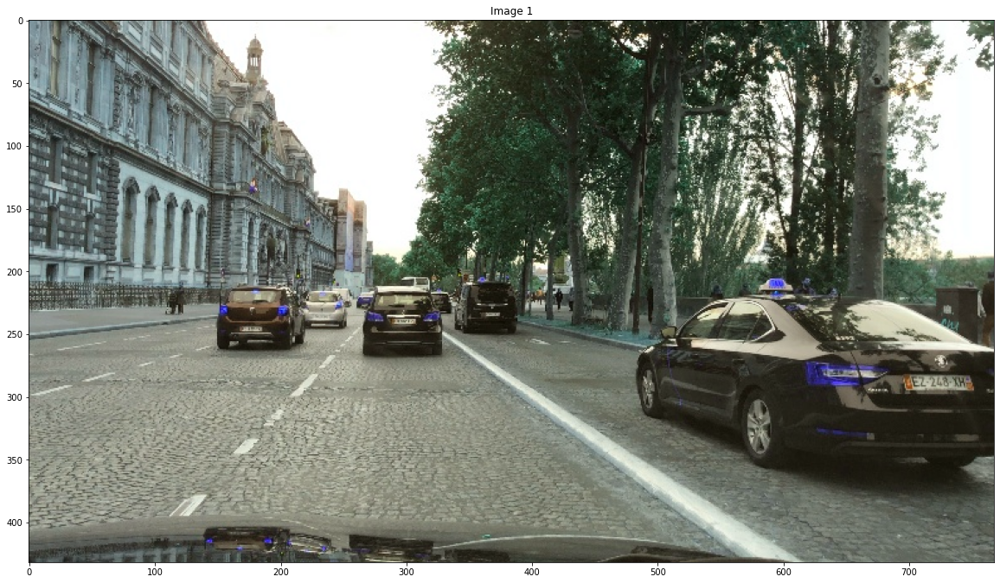

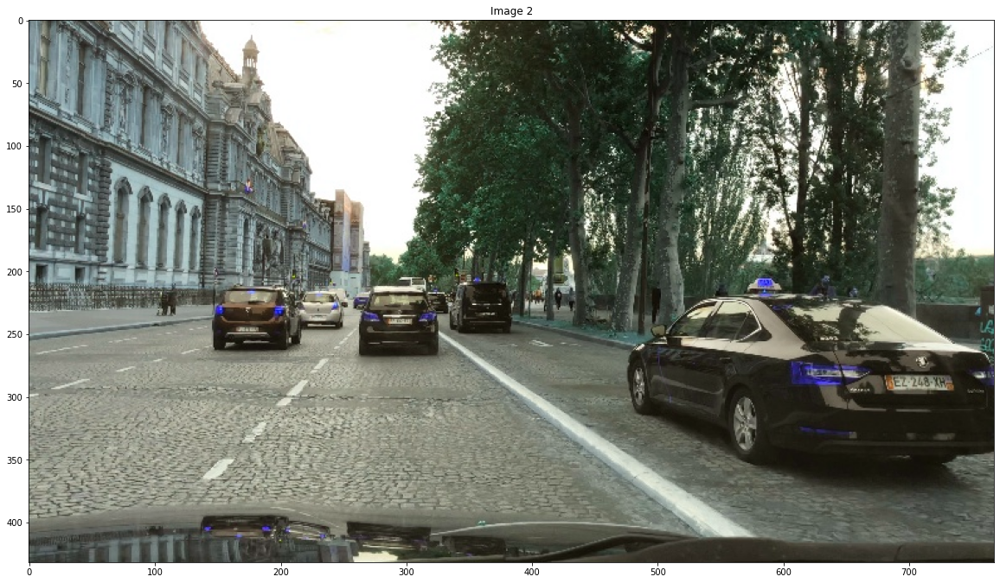

In [10]:
# Load two consecutive images
im1 = cv2.imread("data/images/image0.jpg")
im2 = cv2.imread("data/images/image1.jpg")

plot_image("Image 1", im1)
plot_image("Image 2", im2)

In [12]:
# Create an Empty mask and define the color of output to green
mask = np.zeros_like(im1)
color = (0, 255, 0)

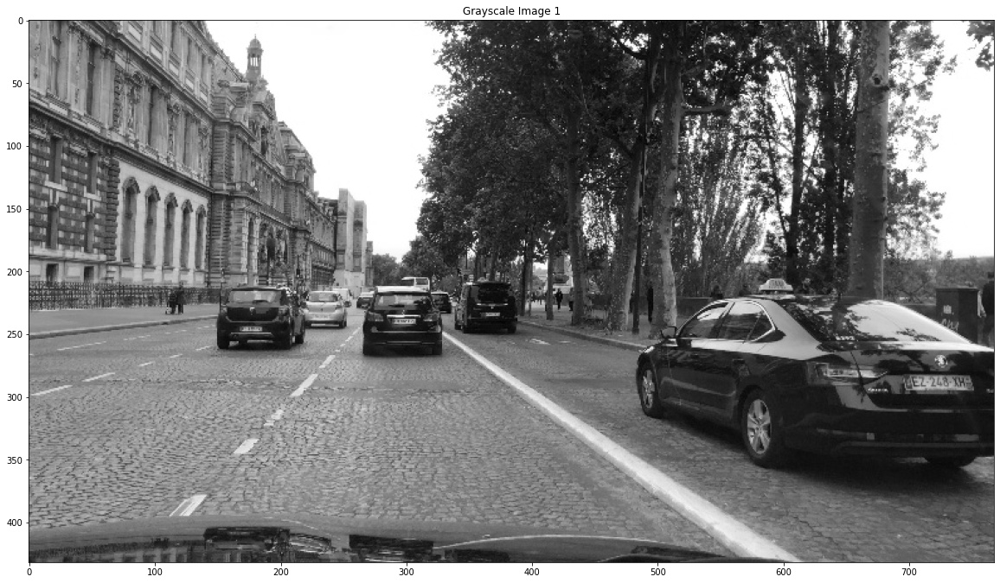

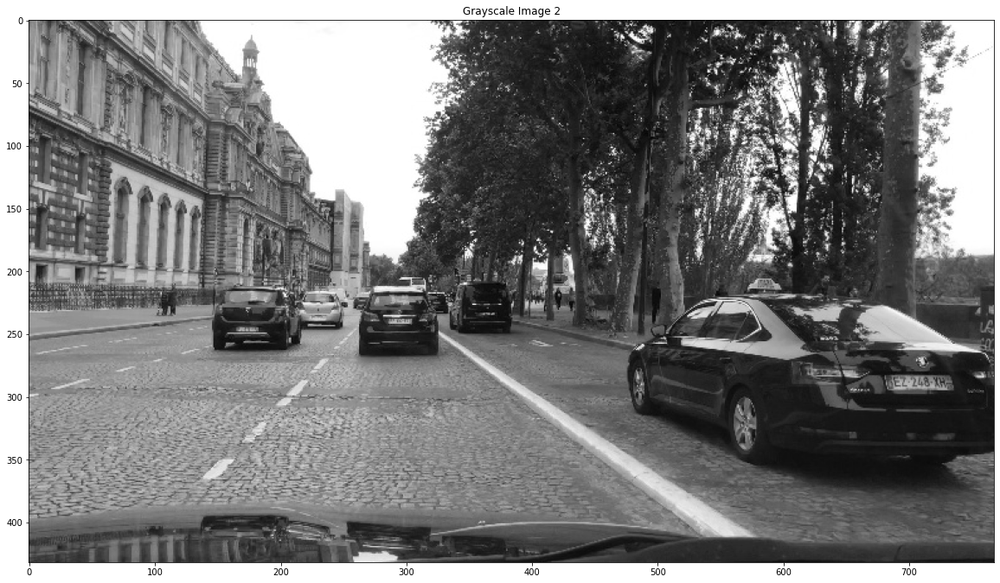

In [13]:
# Convert both images to grayscale
gray1 = cv2.cvtColor(im1, cv2.COLOR_BGR2GRAY)
gray2 = cv2.cvtColor(im2, cv2.COLOR_BGR2GRAY)

plot_image("Grayscale Image 1", gray1, cmap="gray")
plot_image("Grayscale Image 2", gray2, cmap="gray")

Define the parameters and launch the **Shi-Tomasi corner detector** on the first image. 

According to OpenCV: 
> _"As usual, image should be a **grayscale image**. Then you specify **number of corners you want to find**. Then you specify the **quality level**, which is a value between 0-1, which denotes the **minimum quality of corner below which everyone is rejected**. Then we provide the **minimum euclidean distance between corners detected**."_

Refer to the OpenCV docs to [see more about how to define the parameters](https://docs.opencv.org/master/dd/d1a/group__imgproc__feature.html#ga1d6bb77486c8f92d79c8793ad995d541).

In [14]:
feature_params = dict(maxCorners = 300, qualityLevel = 0.0025, minDistance = 15, blockSize = 2) # Default 300, 0.25, 3, 7
prev = cv2.goodFeaturesToTrack(gray1, mask = None, **feature_params)

In [15]:
print(feature_params)
print(prev[0])

{'maxCorners': 300, 'qualityLevel': 0.0025, 'minDistance': 15, 'blockSize': 2}
[[477.  16.]]


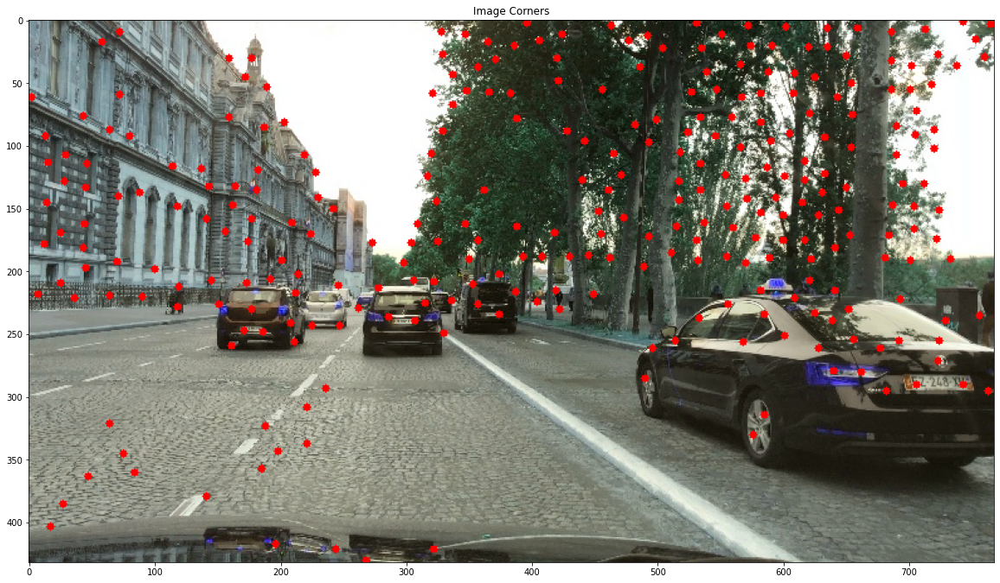

In [16]:
# Go through each detected corner, and draw a dot
image_corners = im1.copy()

for i in prev:
    x,y = i.ravel()
    cv2.circle(image_corners,(int(x),int(y)),3,255,-1)

plot_image("Image Corners", image_corners)

Launch the Lucas Kanade Optical Flow algorithm with the features and both grayscale images.

See the [OpenCV docs for the `calcOpticalFlowPyrLK()` function](https://docs.opencv.org/4.5.3/dc/d6b/group__video__track.html#ga473e4b886d0bcc6b65831eb88ed93323).

In [17]:
lk_params = dict(winSize=(15,15), 
                 maxLevel=2,
                 criteria=(cv2.TERM_CRITERIA_EPS | cv2.TERM_CRITERIA_COUNT, 10, 0.03))

next, status, error = cv2.calcOpticalFlowPyrLK(gray1, gray2, prev, None, **lk_params)

In [18]:
print(lk_params)
idx = 19
print(prev[idx])
print(next[idx])
print(status[idx])
print(error[idx])

{'winSize': (15, 15), 'maxLevel': 2, 'criteria': (3, 10, 0.03)}
[[659.   6.]]
[[666.6108    -9.550047]]
[0]
[1.8936231e+23]


In [19]:
# Store the Matches (status=1 means a match)
good_matches_old = prev[status == 1]
good_matches_new = next[status == 1]

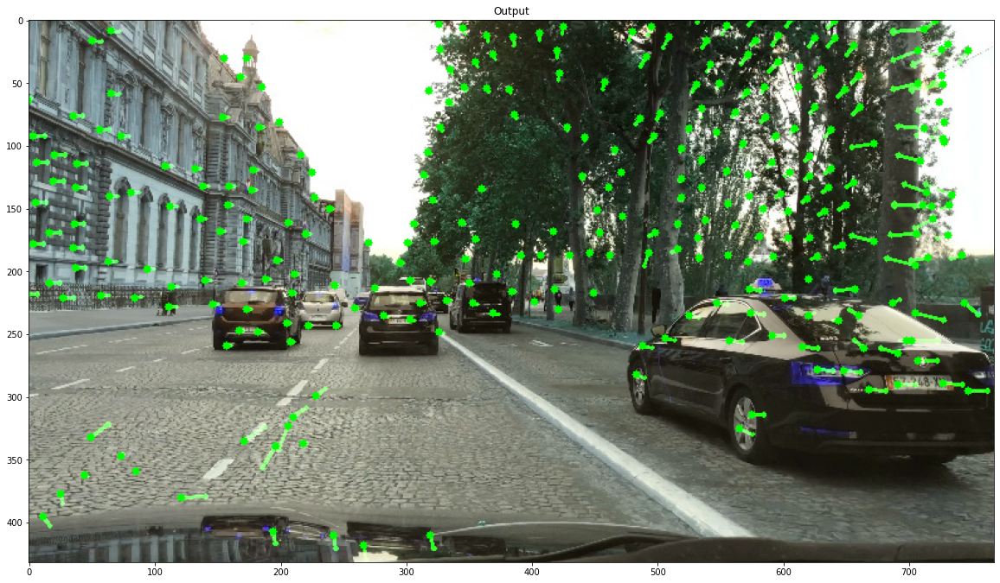

In [20]:
# Go through each matched feature, and draw it on the second image

for new, old in zip(good_matches_new, good_matches_old):
    a, b = new.ravel()
    c, d = old.ravel()
    
    mask = cv2.arrowedLine(mask, (int(a), int(b)), (int(c), int(d)), color, 2)
    im2 = cv2.circle(im2, (int(a), int(b)), 3, color, -1)

# Overlays the optical flow tracks on the original frame
output = cv2.add(im2, mask)

# Updates previous frame
gray1 = gray2.copy()

# Updates previous good feature points
prev = good_matches_new.reshape(-1, 1, 2)

#cv2.imwrite("output.jpg", output)
plot_image("Output", output)

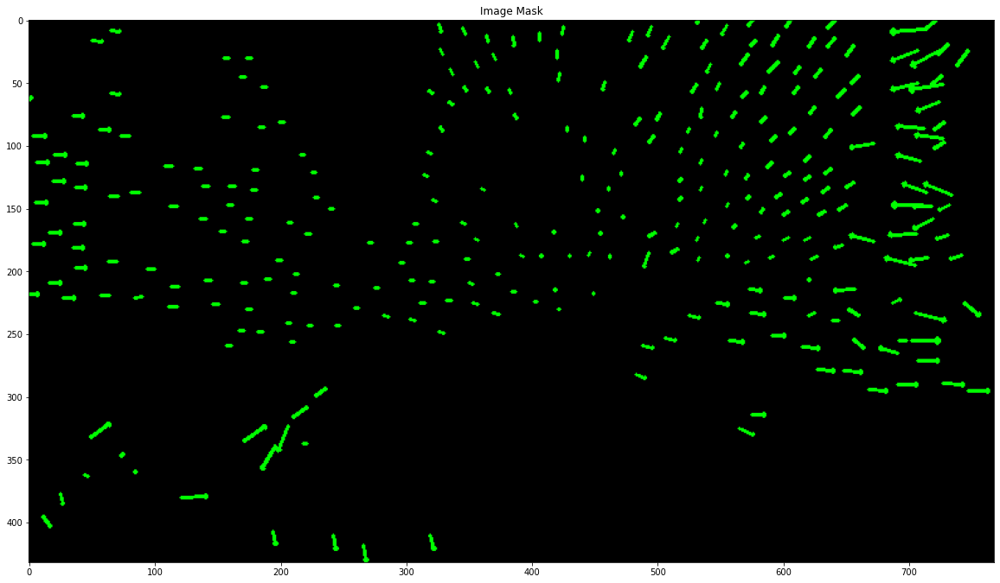

In [21]:
plot_image("Image Mask", mask)

# Example 2: Sparse Optical Flow on a video

In [25]:
def lk_from_image(image):
    global idx, gray1, mask, prev
    if idx==0:
        gray1 = cv2.cvtColor(image, cv2.COLOR_BGR2GRAY)
        feature_params = dict(maxCorners = 600, qualityLevel = 0.0025, minDistance = 15, blockSize = 2)
        prev = cv2.goodFeaturesToTrack(gray1, mask = None, **feature_params)
        mask = np.zeros_like(image)
        idx+=1
        return image
    # Else
    im2 = image
    if idx%15==0:
        mask = np.zeros_like(image)
    
    if idx%5==0:
        # Every 5 images, relaunch the feature detection
        feature_params = dict(maxCorners = 300, qualityLevel = 0.2, minDistance = 2, blockSize = 7)
        prev = cv2.goodFeaturesToTrack(gray1, mask = None, **feature_params)
    
    color = (0, 255, 0)
    gray2 = cv2.cvtColor(im2, cv2.COLOR_BGR2GRAY)
 
    lk_params = dict(winSize = (15,15), maxLevel = 2, criteria = (cv2.TERM_CRITERIA_EPS | cv2.TERM_CRITERIA_COUNT, 10, 0.03))
    next, status, error = cv2.calcOpticalFlowPyrLK(gray1, gray2, prev, None, **lk_params)

    good_matches_old = prev[status == 1]
    good_matches_new = next[status == 1]

    for new, old in zip(good_matches_new, good_matches_old):
        a, b = new.ravel()
        c, d = old.ravel()            
        mask = cv2.arrowedLine(mask, (int(a), int(b)), (int(c), int(d)), color, 2)
        im2 = cv2.circle(im2, (int(a), int(b)), 3, color, -1)

    output = cv2.add(im2, mask)
    gray1 = gray2.copy()
    prev = good_matches_new.reshape(-1, 1, 2)
    idx += 1
    
    return output

In [23]:
from moviepy.editor import VideoFileClip
idx = 0

video_file = "data/videos/skateboard.mp4"
clip = VideoFileClip(video_file).subclip(0,20)
white_clip = clip.fl_image(lk_from_image)
%time white_clip.write_videofile("output/output_lk_skateboard.mp4",audio=False)

Moviepy - Building video output/output_lk_skateboard.mp4.
Moviepy - Writing video output/output_lk_skateboard.mp4



Moviepy - Done !
Moviepy - video ready output/output_lk_skateboard.mp4
CPU times: user 6.9 s, sys: 4.75 s, total: 11.7 s
Wall time: 7.66 s


In [24]:
from IPython.display import HTML
from base64 import b64encode

mp4 = open('output/output_lk_skateboard.mp4','rb').read()
data_url = "data:video/mp4;base64," + b64encode(mp4).decode()
HTML("""
<video width=800 controls>
      <source src="%s" type="video/mp4">
</video>
""" % data_url)

# Example 3: Another Example of Sparse Optical Flow on a Video

In [26]:
# Parameters for Shi-Tomasi corner detection
feature_params = dict(maxCorners=300, qualityLevel=0.2, minDistance=2, blockSize=7)

# Parameters for Lucas-Kanade optical flow
lk_params = dict(winSize=(15, 15),
                 maxLevel=2,
                 criteria=(cv2.TERM_CRITERIA_EPS | cv2.TERM_CRITERIA_COUNT, 10, 0.03)
                 )

# The video feed is read in as a VideoCapture object
video_capture = cv2.VideoCapture("data/videos/shibuya.mp4")

# Variable for color to draw optical flow track
color = (0, 255, 0)

# ret = a boolean return value from getting the frame, first_frame = the first frame in the entire video sequence
ret, first_frame = video_capture.read()

# Converts frame to grayscale because we only need the luminance channel for detecting edges - less computationally expensive
prev_gray = cv2.cvtColor(first_frame, cv2.COLOR_BGR2GRAY)

# Finds the strongest corners in the first frame by Shi-Tomasi method - we will track the optical flow for these corners
# https://docs.opencv.org/3.0-beta/modules/imgproc/doc/feature_detection.html#goodfeaturestotrack
prev = cv2.goodFeaturesToTrack(prev_gray, mask=None, **feature_params)

# Creates an image filled with zero intensities with the same dimensions as the frame - for later drawing purposes
mask = np.zeros_like(first_frame)

In [27]:
while video_capture.isOpened():
    # ret = a boolean return value from getting the frame, frame = the current frame being projected in the video
    ret, frame = video_capture.read()

    if frame is None:
        print("No frame here")
        break

    # Converts each frame to grayscale
    gray = cv2.cvtColor(frame, cv2.COLOR_BGR2GRAY)

    # Calculates sparse optical flow by Lucas-Kanade method
    # https://docs.opencv.org/3.0-beta/modules/video/doc/motion_analysis_and_object_tracking.html#calcopticalflowpyrlk
    prev = cv2.goodFeaturesToTrack(prev_gray, mask=None, **feature_params)
    next_points, status, error = cv2.calcOpticalFlowPyrLK(prev_gray, gray, prev, None, **lk_params)

    # Selects good feature points for previous position
    good_old = prev[status == 1].astype(int)

    # Selects good feature points for next position
    good_new = next_points[status == 1].astype(int)

    # Draws the optical flow tracks
    for i, (new, old) in enumerate(zip(good_new, good_old)):
        # Returns a contiguous flattened array as (x, y) coordinates for new point
        a, b = new.ravel()

        # Returns a contiguous flattened array as (x, y) coordinates for old point
        c, d = old.ravel()

        # Draws line between new and old position with green color and 2 thickness
        mask = cv2.line(mask, (a, b), (c, d), color, 2)

        # Draws filled circle (thickness of -1) at new position with green color and radius of 3
        frame = cv2.circle(frame, (a, b), 3, color, -1)

    # Overlays the optical flow tracks on the original frame
    output = cv2.add(frame, mask)

    # Updates previous frame
    prev_gray = gray.copy()

    # Updates previous good feature points
    prev = good_new.reshape(-1, 1, 2)

    # Opens a new window and displays the output frame
    cv2.imshow("sparse optical flow", output)

    # Frames are read by intervals of 10 milliseconds. The programs breaks out of the while loop when the user presses the 'q' key
    if cv2.waitKey(10) & 0xFF == ord('q'):
        break

In [28]:
# The following frees up resources and closes all windows
video_capture.release()
cv2.destroyAllWindows()